In [2]:
import umap, random, math
import numpy as np 
import matplotlib.pyplot as plt 
from glob import glob 
from scipy.signal import * 
from matplotlib import * 

%matplotlib inline 
plt.rcParams['font.size'] = '16' 

In [3]:
def zero_pole_filter(f, fs):
    w = (2*math.pi*f)/fs
    r = 0.9
    z0 = [math.cos(w), math.sin(w)]
    zp = [r*math.cos(w), r*math.sin(w)]
    b = [1, -2*z0[0], (z0[0]*z0[0])+(z0[1]*z0[1])]
    a = [1, -2*zp[0], (zp[0]*zp[0])+(zp[1]*zp[1])]
    return b, a

def high_pass_filter(data, Fs):
    ndata = np.copy(data)
    b, a =  zero_pole_filter(0, Fs)
    for i in range(data.shape[1]):
        ndata[:, i] = lfilter(b, a, ndata[:, i])
    return ndata

def low_pass_filter(data, Fs, lowcut):
    ndata = np.copy(data)
    b = firwin(numtaps=32, cutoff=lowcut, nyq=Fs/2.0)
    for i in range(data.shape[1]):
        ndata[:, i] = lfilter(b, 1, ndata[:, i])
    return ndata

In [4]:
def plot_embeddings(dic_embeddings, order_plot):
    for key in order_plot: 
        embedding = dic_embeddings[key][:, 2:] 
        labels = dic_embeddings[key][:, 0] 

        plt.figure(figsize=(12, 8)) 
        plt.scatter(embedding[:, 0], embedding[:, 1], c=labels, cmap='nipy_spectral', s=20) 
        plt.gca().set_aspect('equal', 'datalim') 
        plt.colorbar(boundaries=np.append(np.unique(labels), labels[-1]+1)-0.5).set_ticks(np.unique(labels)) 
        plt.title(key) 


In [5]:
def get_embeddings(files, feat='time', mode='u', n=10, dist=0.1, metric='euclidean', n_epochs=500, n_components=2, markers_set=[], **kwargs):
    dic_embeddings = {} 
    dic_data = {} 
    
    for f in files: 
        if(f.endswith('.csv')):
            data = np.loadtxt(f, delimiter=',') 
        elif(f.endswith('.npz')):
            data = np.load(f) 
            data = data[data.files[0]]
        labels = data[:, 0].astype(int) 
        days = data[:, 1].astype(int) 
        parts_f = os.path.basename(f).split('.')[0].split('_')
        if(len(parts_f) > 3):
            key = parts_f[1]+'_'+parts_f[2]
        else:
            key = parts_f[1] 
        print(key)
        if(feat=='time'):
            features = np.copy(data[:, 2:])
        elif(feat=='stf'):
            spectograms = np.abs(stft(data[:, 2:], fs=100, window='hann', nperseg=64, return_onesided=True, axis=1)[-1]) 
            features = np.vstack((np.dstack((spectograms)))).T
        elif(feat=='freq'):
            if('cut_freq' in kwargs):
                mag = np.abs(np.fft.fft(data[:, 2:], axis=1))
                freq = np.fft.fftfreq(mag.shape[1], d=1/100)[:round(mag.shape[1]/2)]
                if(kwargs["pass_filter"] == 'low'):
                    idxs_valid = np.where(freq < kwargs["cut_freq"])[0]
                elif(kwargs["pass_filter"] == 'high'): 
                    idxs_valid = np.where(freq > kwargs["cut_freq"])[0]
                else:
                    idxs_valid = np.where(freq > kwargs["cut_freq"][0])[0]
                    idxs_valid = idxs_valid[np.where(freq[idxs_valid] < kwargs["cut_freq"][1])[0]]
                features = mag[:, idxs_valid]
                freq = freq[idxs_valid] 
            else:
                features = np.abs(np.fft.fft(data[:, 2:], axis=1))[:, :round((data.shape[1]-2)/2)]  
            
        dic_data[key] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], features)) 
        reducer = umap.UMAP(random_state=1, n_components=n_components, n_neighbors=n, metric=metric, min_dist=dist, n_epochs=n_epochs)
        
        if(mode=='u'):
            embedding = reducer.fit_transform(features)
            dic_embeddings[key] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], embedding))
        elif(mode=='s'):
            idxs_train = np.where(days==1)[0]
            idxs_test = np.where(days==2)[0]
            embedding_train = reducer.fit_transform(features[idxs_train], y=labels[idxs_train]) 
            embedding_test = reducer.transform(features[idxs_test])
            dic_embeddings[key] = {}
            dic_embeddings[key]['train'] = np.hstack((labels[idxs_train, np.newaxis], days[idxs_train, np.newaxis], embedding_train)) 
            dic_embeddings[key]['test'] = np.hstack((labels[idxs_test, np.newaxis], days[idxs_test, np.newaxis], embedding_test)) 
            
    for subset in markers_set: 
        subset_name = '_'.join(subset) 
        data = np.hstack(([dic_data[key][:, 2:] for key in subset])) 
        labels = dic_data[subset[0]][:, 0].astype(int) 
        days = dic_data[subset[0]][:, 1].astype(int) 

        dic_data[subset_name] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], data)) 
        reducer = umap.UMAP(random_state=1, n_components=2, n_neighbors=n, metric=metric, min_dist=dist) 
        
        if(mode=='u'):
            embedding = reducer.fit_transform(data)
            dic_embeddings[subset_name] = np.hstack((labels[:, np.newaxis], days[:, np.newaxis], embedding))
        elif(mode=='s'):
            idxs_train = np.where(days==1)[0]
            idxs_test = np.where(days==2)[0]
            embedding_train = reducer.fit_transform(data[idxs_train], y=labels[idxs_train]) 
            embedding_test = reducer.transform(data[idxs_test])
            idxs = np.concatenate((idxs_train, idxs_test))
            embedding = np.vstack((embedding_train, embedding_test))
            dic_embeddings[subset_name] = {}
            dic_embeddings[subset_name]['train'] = np.hstack((labels[idxs_train, np.newaxis], days[idxs_train, np.newaxis], embedding_train)) 
            dic_embeddings[subset_name]['test'] = np.hstack((labels[idxs_test, np.newaxis], days[idxs_test, np.newaxis], embedding_test)) 

    return dic_embeddings, dic_data


In [6]:
!python3 generate_frames.py -p ./frames

imu
ttc
ias
fax
nexus
fme
ftc
fle


<IPython.core.display.Javascript object>


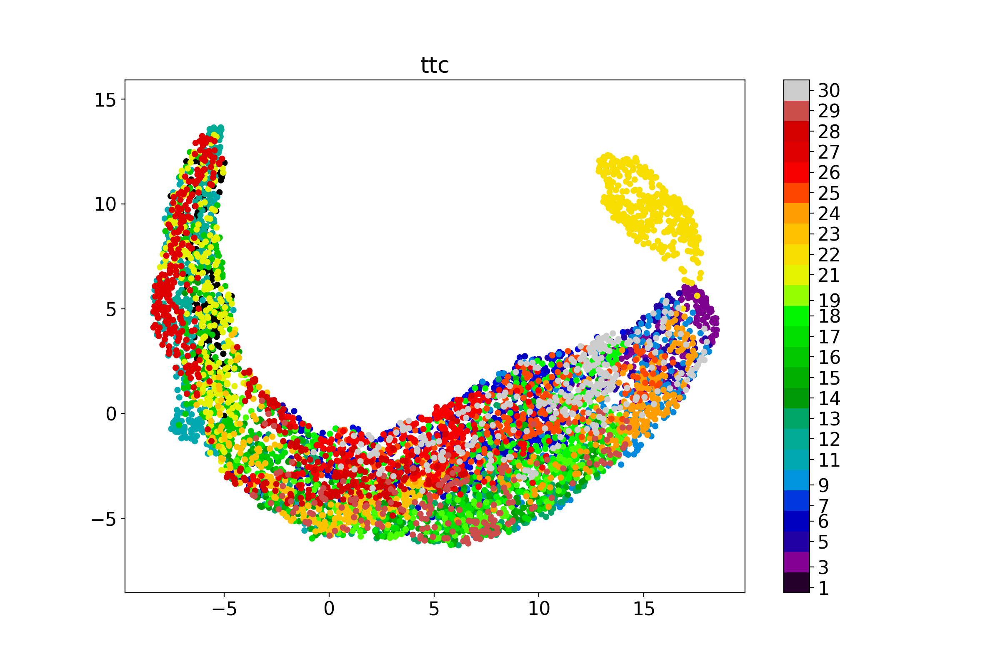

<IPython.core.display.Javascript object>


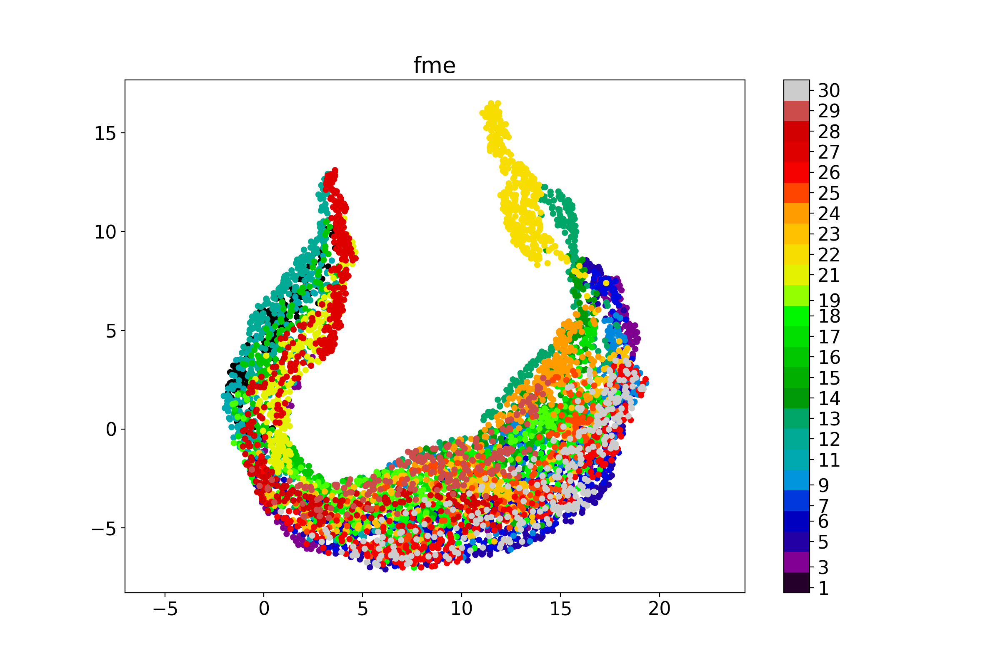

<IPython.core.display.Javascript object>


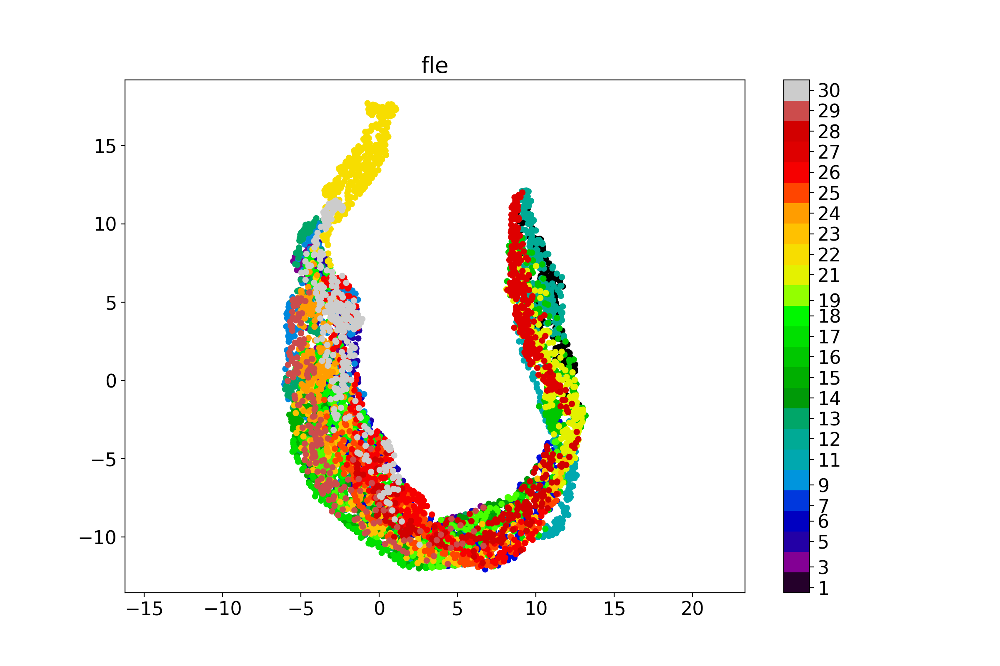

<IPython.core.display.Javascript object>


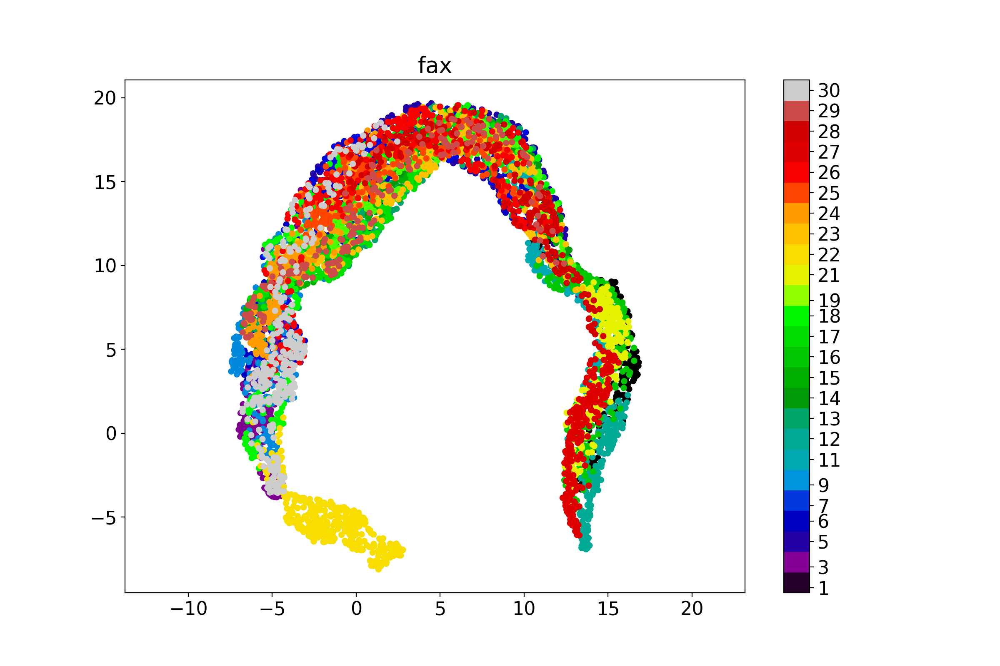

<IPython.core.display.Javascript object>


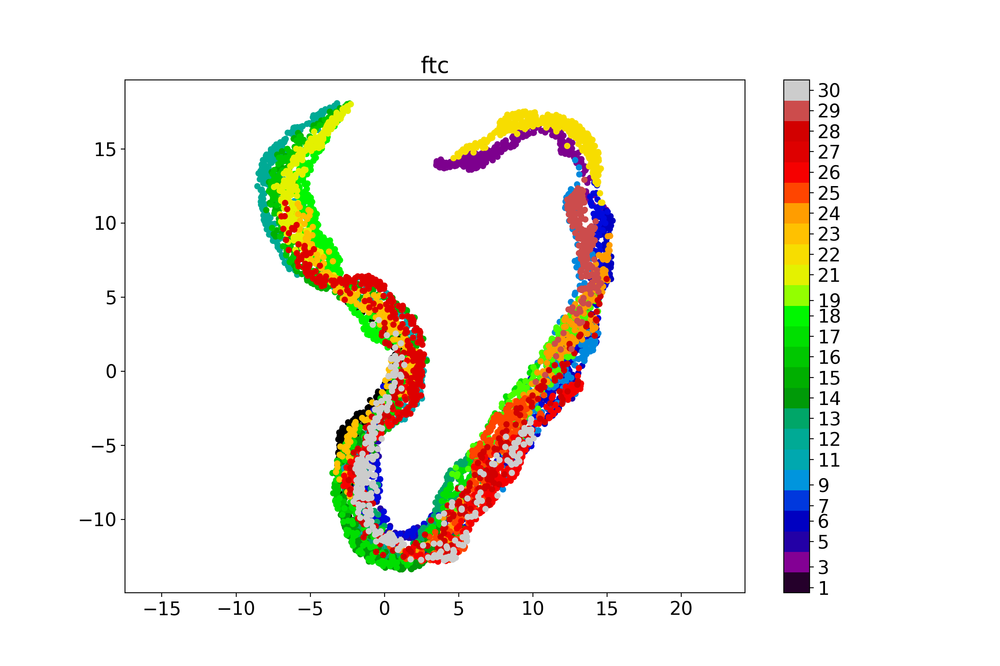

<IPython.core.display.Javascript object>


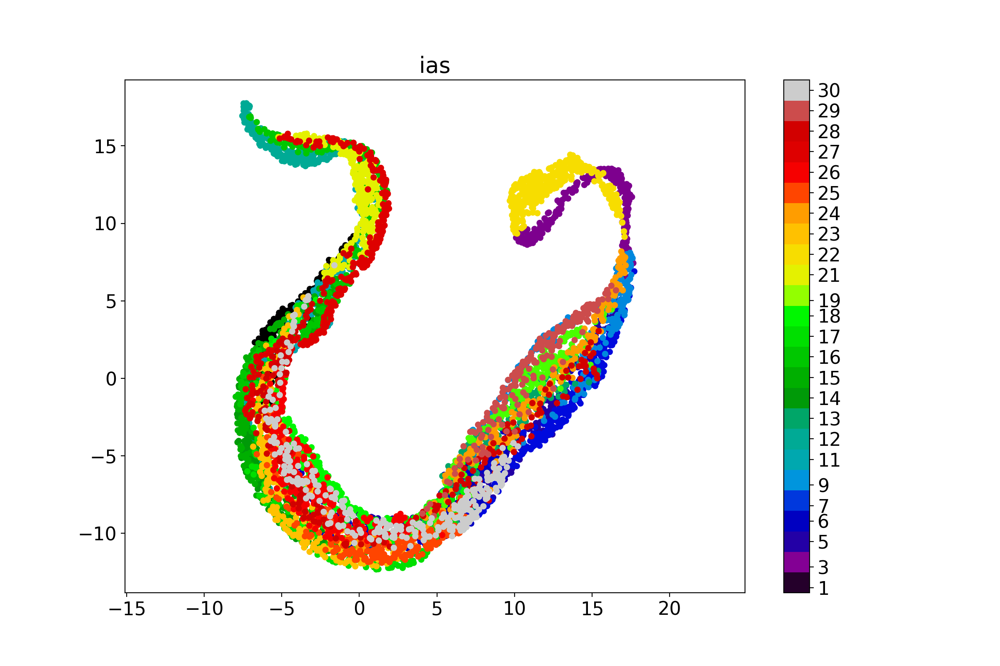

<IPython.core.display.Javascript object>


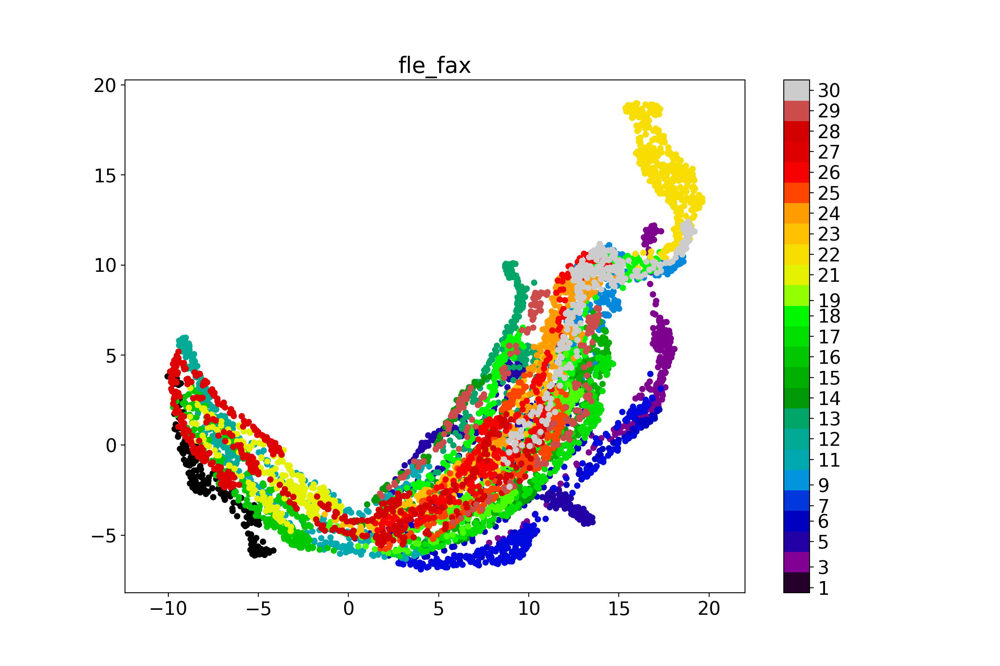

<IPython.core.display.Javascript object>


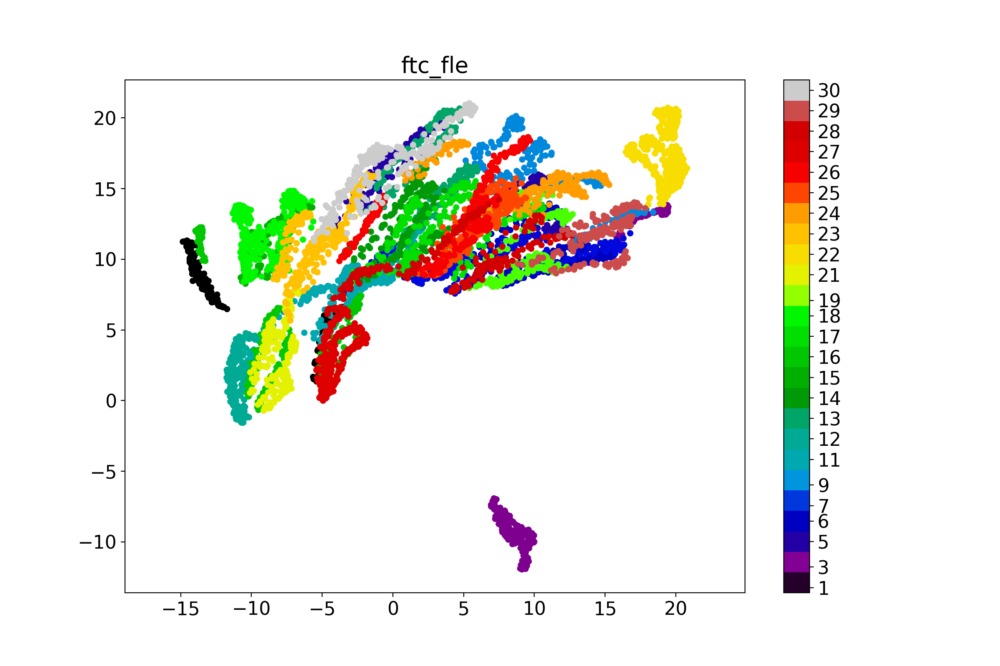

<IPython.core.display.Javascript object>


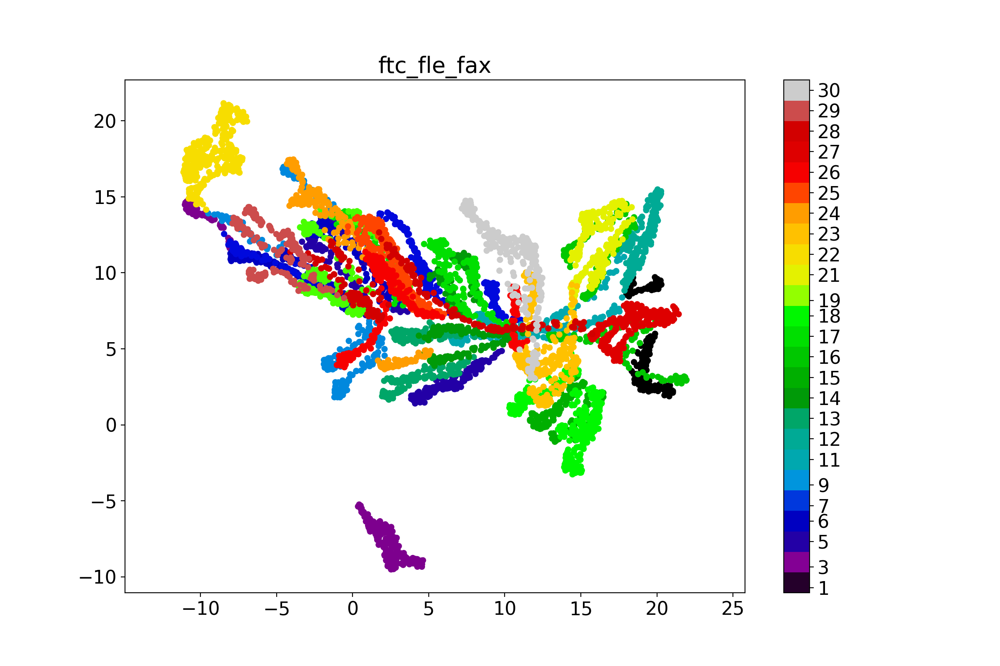

<IPython.core.display.Javascript object>


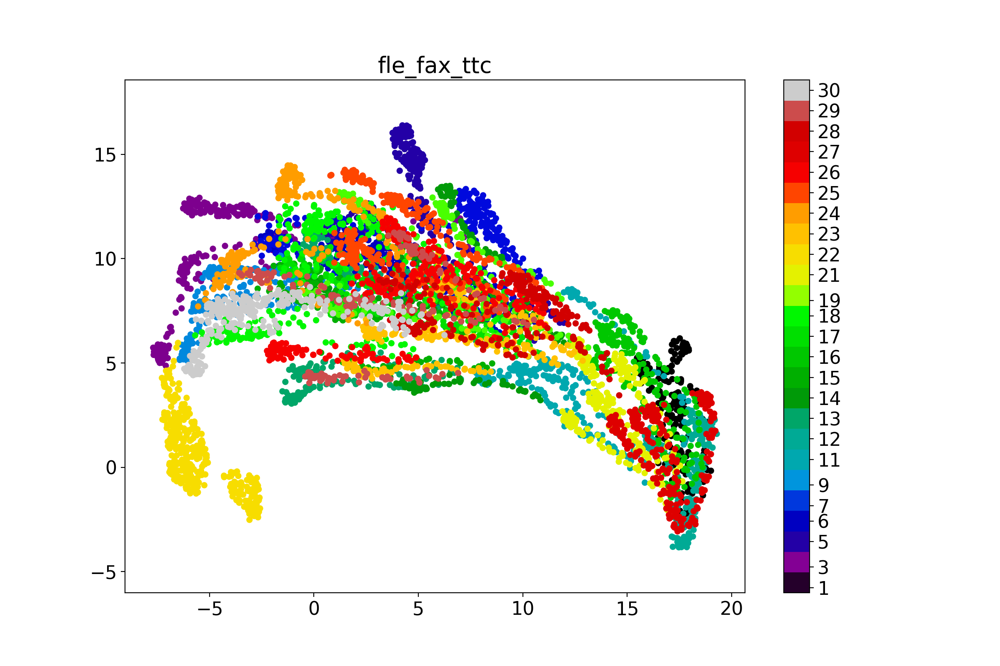

<IPython.core.display.Javascript object>


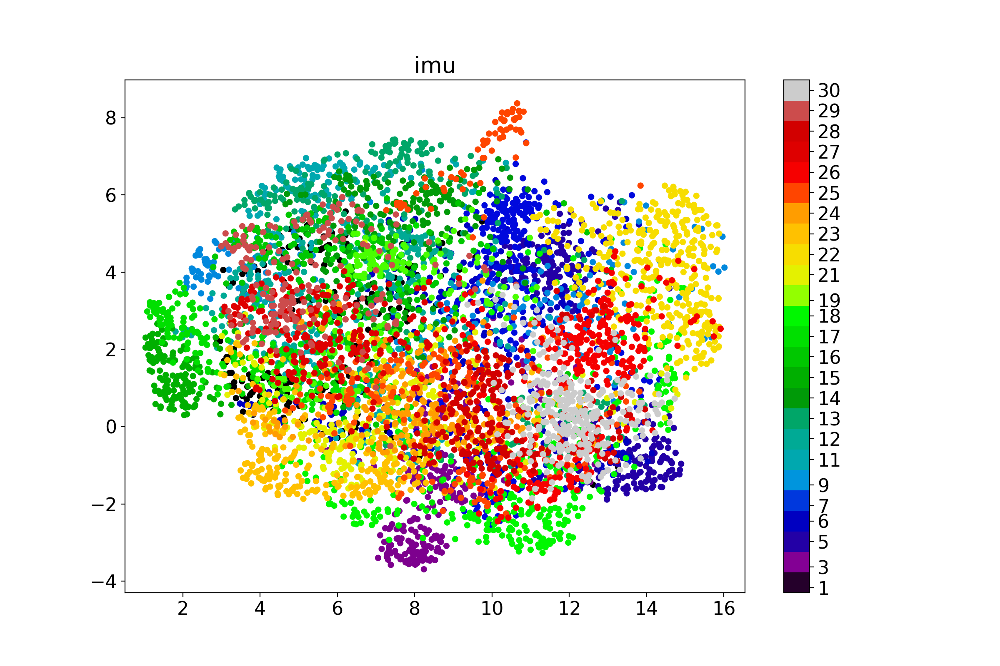

<IPython.core.display.Javascript object>


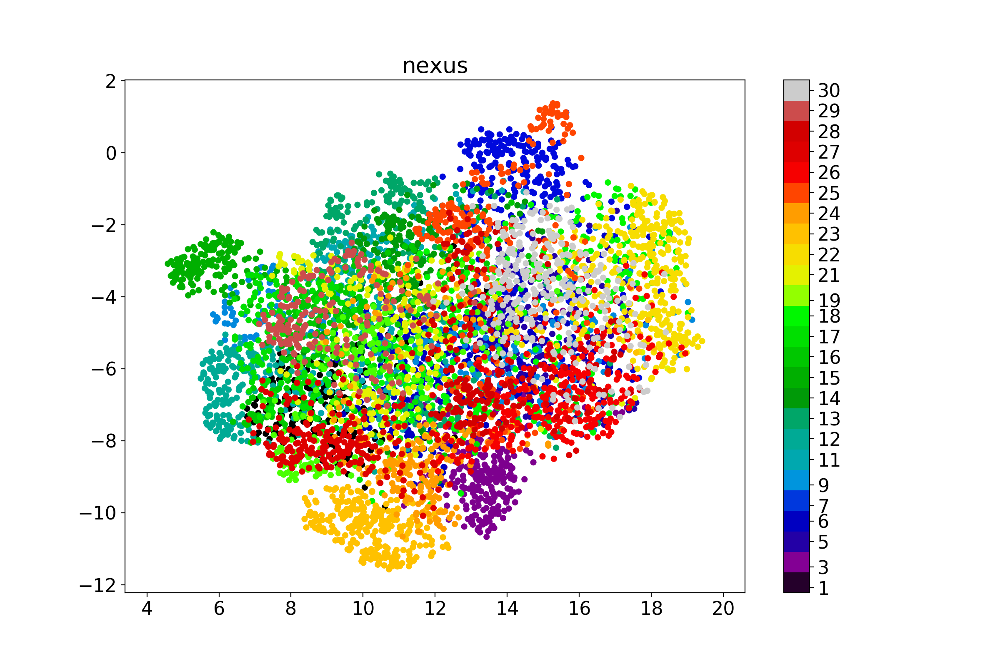

In [7]:
markers = [['fle', 'fax'], ['ftc', 'fle'], ['ftc', 'fle', 'fax'], ['fle', 'fax', 'ttc']]
files = glob("frames/*.csv")
dic_embeddings, dic_data = get_embeddings(files, feat='freq', mode='u', n=100, dist=0.8, markers_set=markers)

list_acc = ['imu', 'nexus'] 
list_concat = ['_'.join(m) for m in markers] 
list_markers = list(set(list(dic_embeddings.keys())) - set(list_acc) - set(set(list_concat)))  
order_plot = np.concatenate((list_markers, list_concat, list_acc)) 

plot_embeddings(dic_embeddings, order_plot)


In [8]:
!python3 generate_frames.py -p ./frames -d 1

imu
ttc
ias
fax
nexus
fme
ftc
fle


<IPython.core.display.Javascript object>


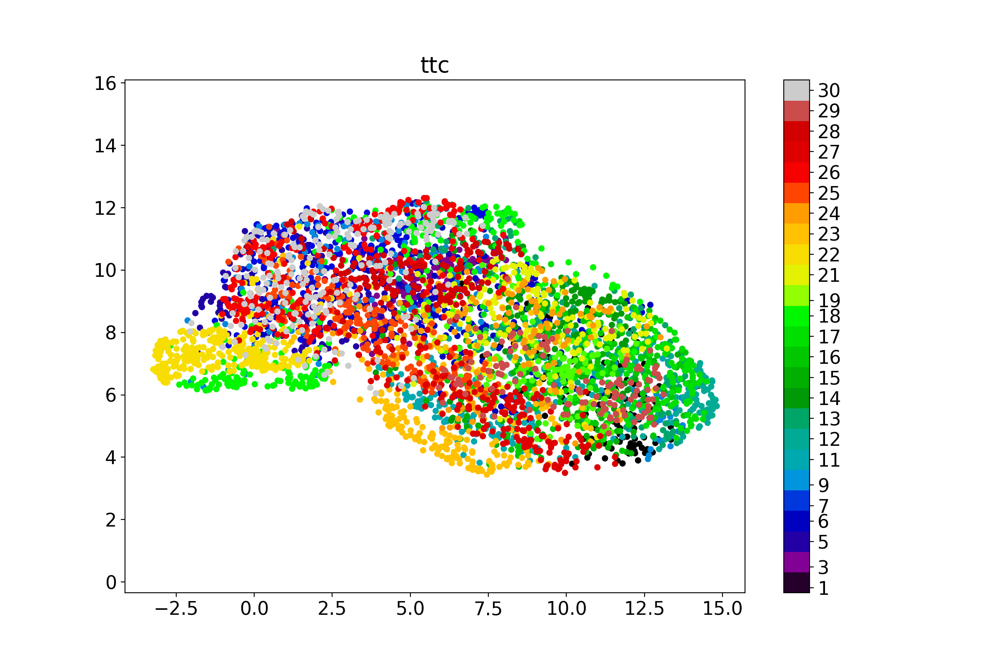

<IPython.core.display.Javascript object>


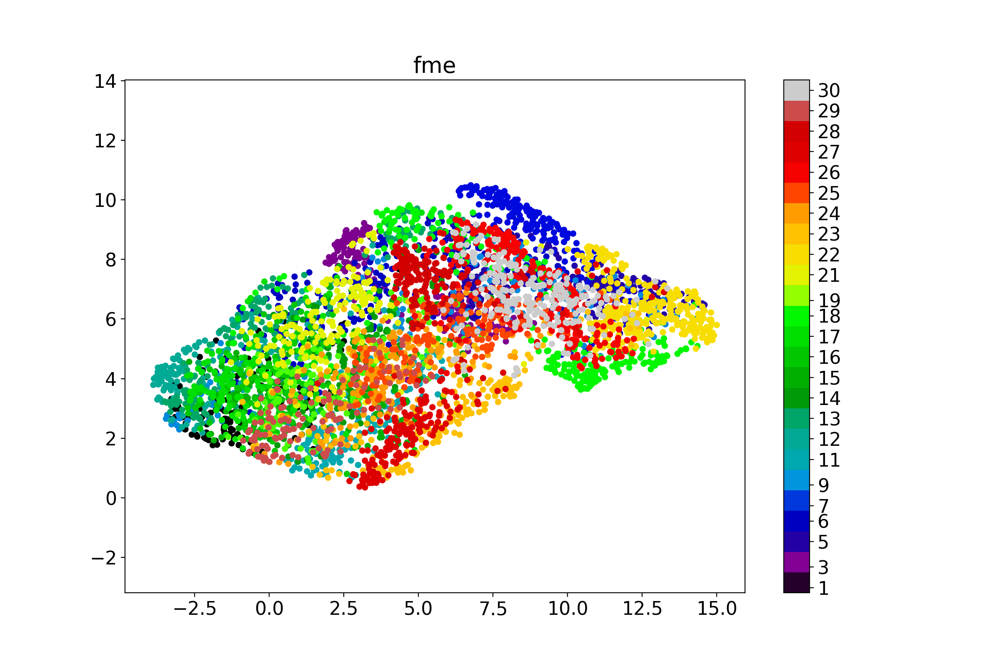

<IPython.core.display.Javascript object>


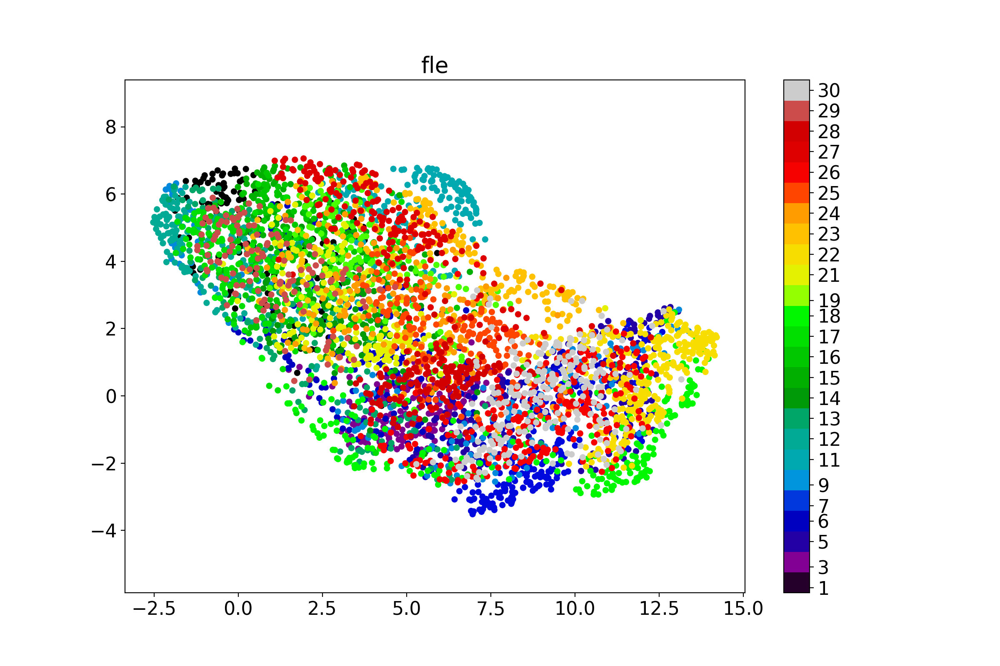

<IPython.core.display.Javascript object>


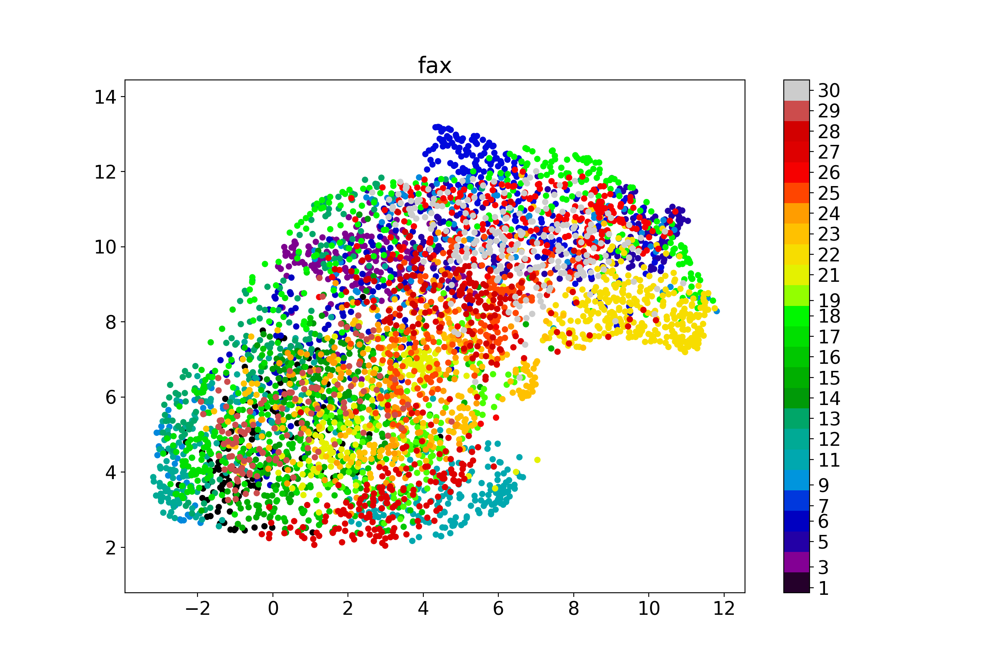

<IPython.core.display.Javascript object>


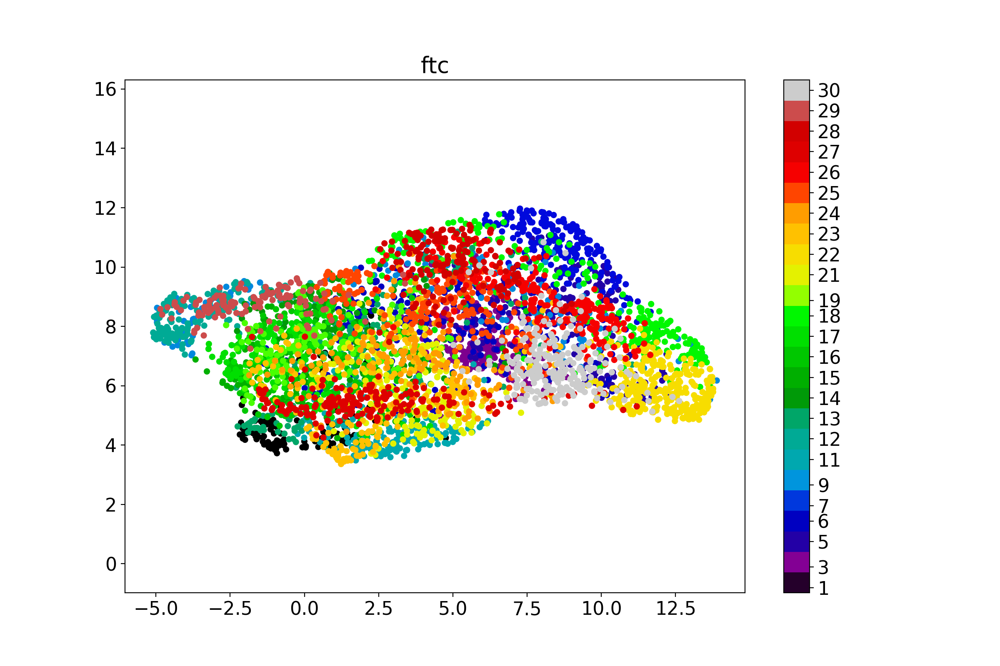

<IPython.core.display.Javascript object>


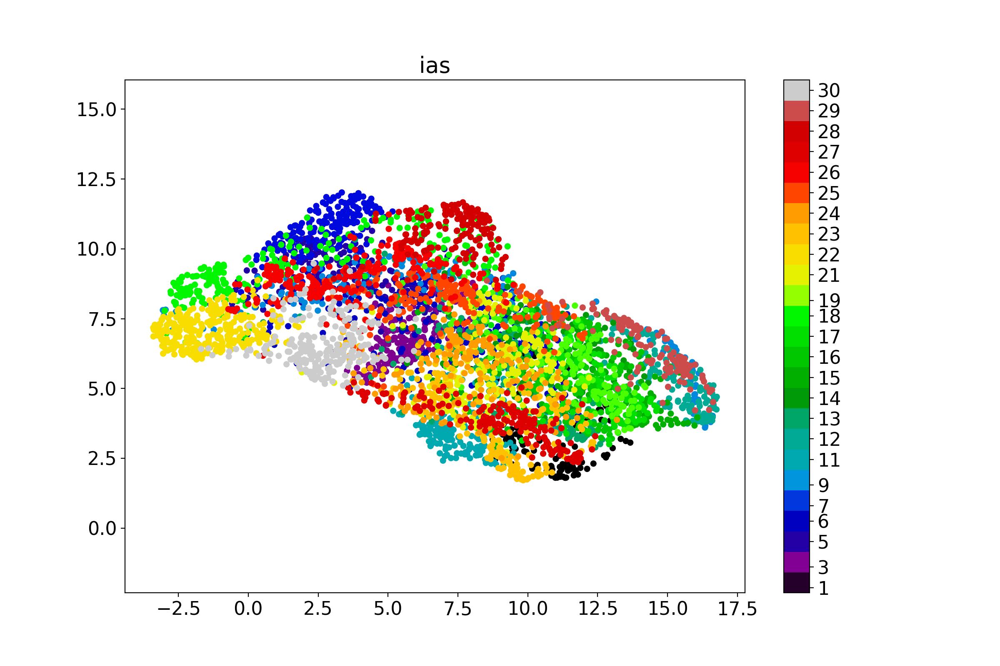

<IPython.core.display.Javascript object>


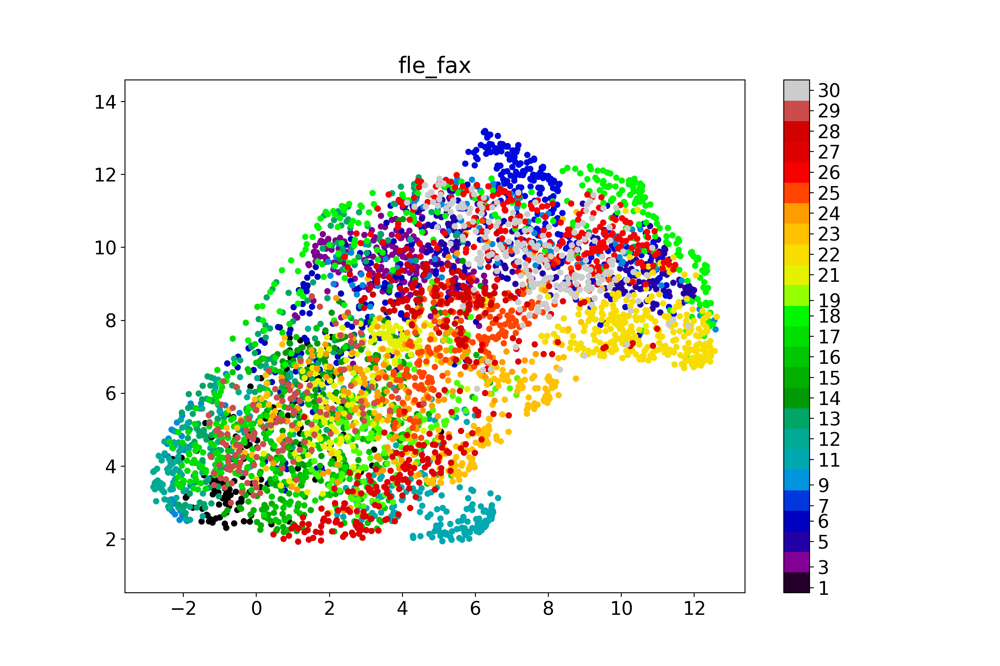

<IPython.core.display.Javascript object>


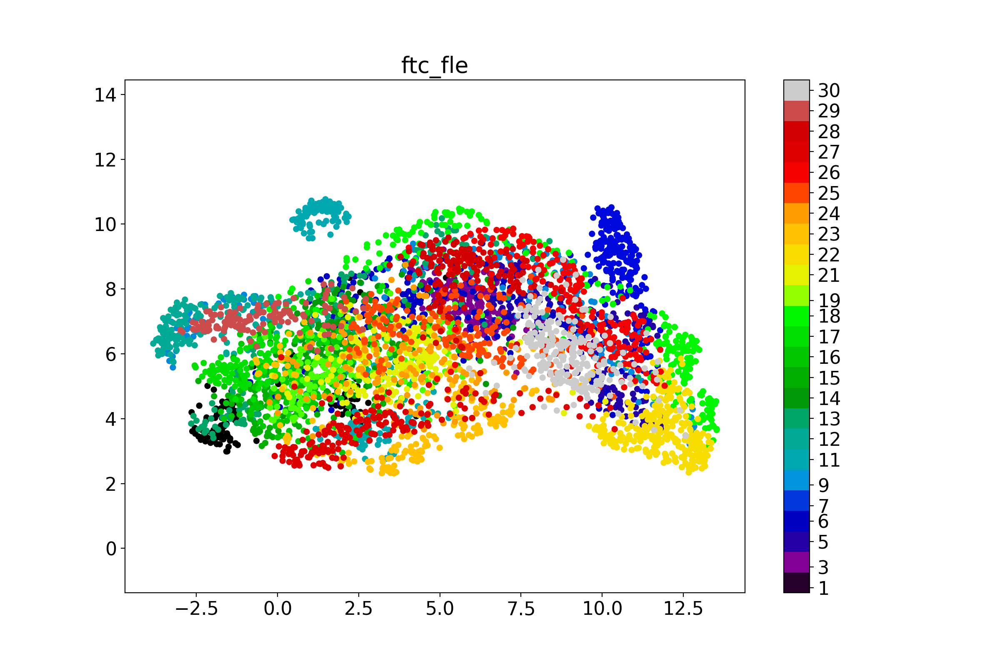

/Users/geise/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


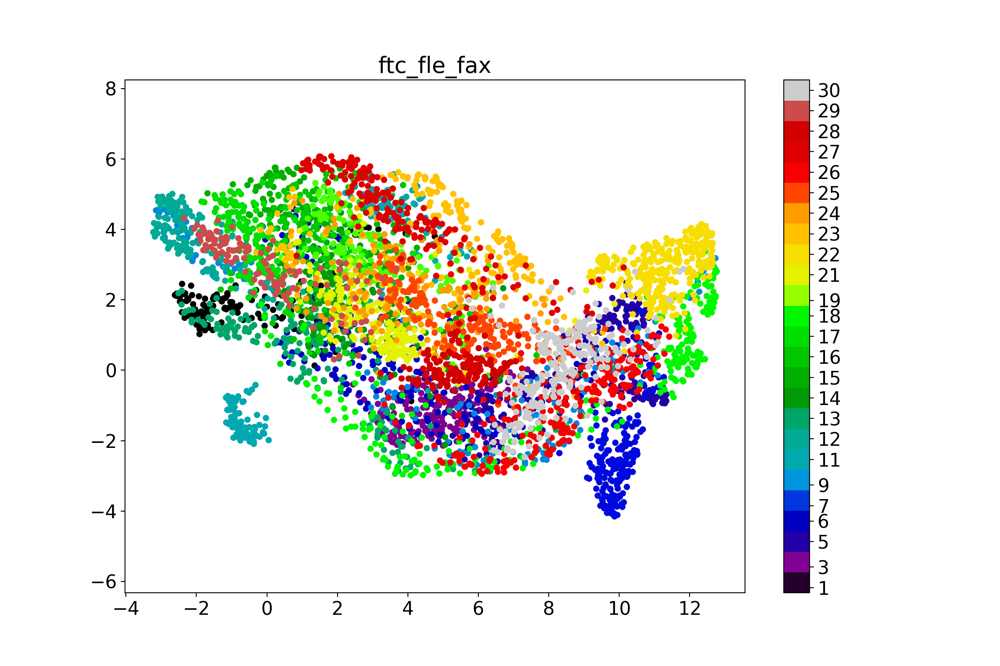

<IPython.core.display.Javascript object>


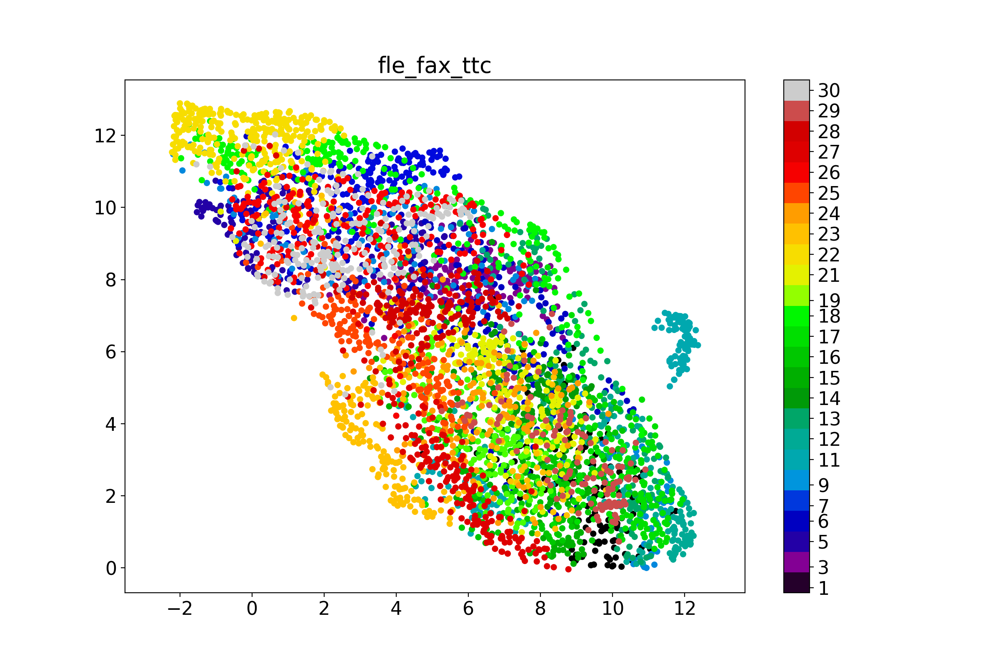

<IPython.core.display.Javascript object>


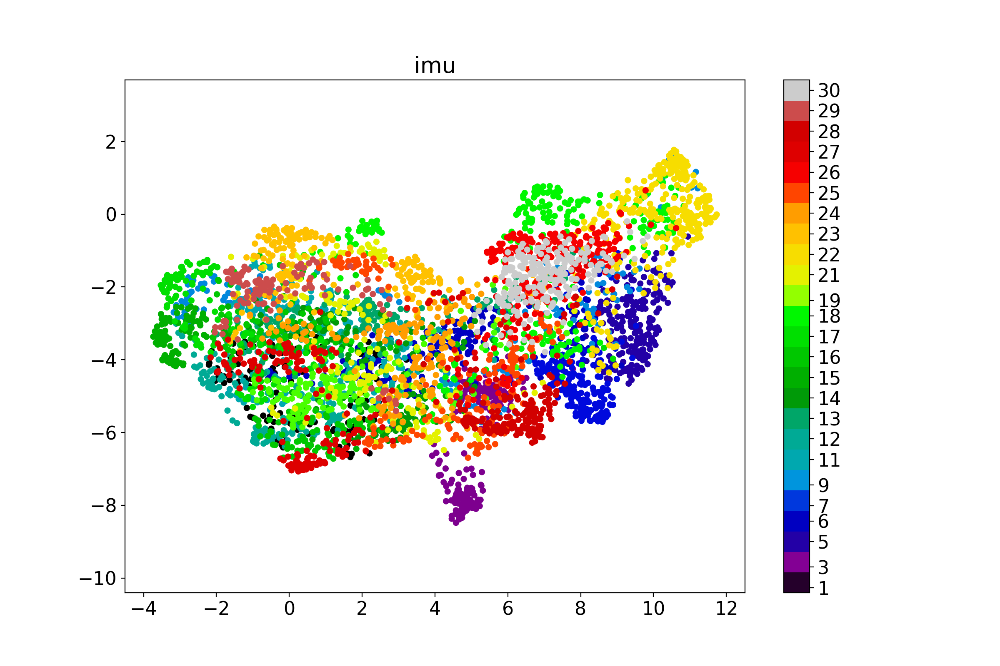

<IPython.core.display.Javascript object>


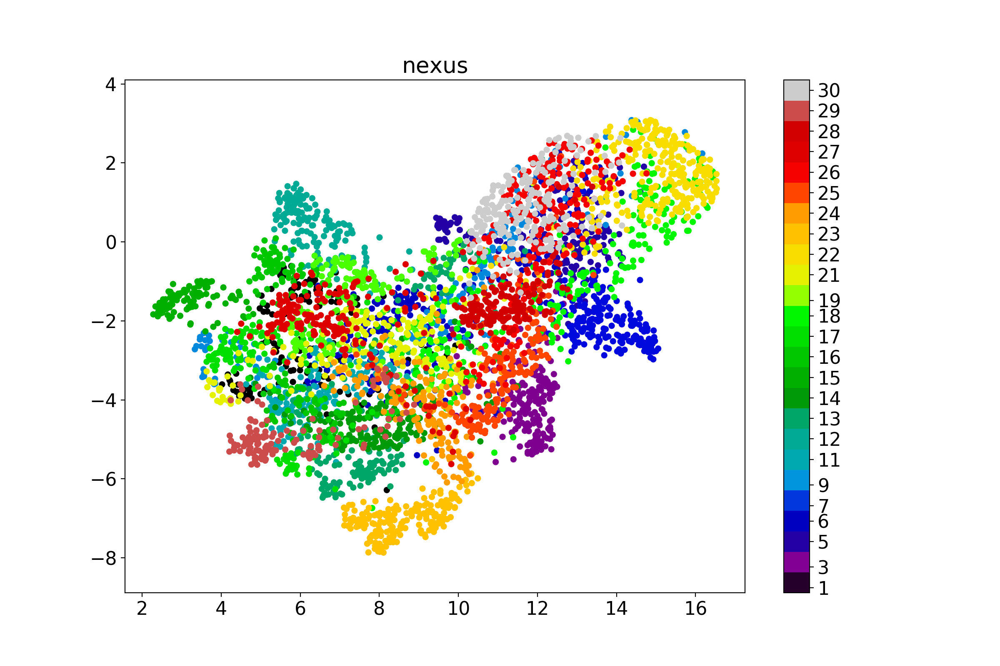

In [9]:
markers = [['fle', 'fax'], ['ftc', 'fle'], ['ftc', 'fle', 'fax'], ['fle', 'fax', 'ttc']]
files = glob("frames/*.csv")
dic_embeddings, dic_data = get_embeddings(files, feat='freq', mode='u', n=50, dist=0.5, markers_set=markers)

list_acc = ['imu', 'nexus'] 
list_concat = ['_'.join(m) for m in markers] 
list_markers = list(set(list(dic_embeddings.keys())) - set(list_acc) - set(set(list_concat)))  
order_plot = np.concatenate((list_markers, list_concat, list_acc)) 

plot_embeddings(dic_embeddings, order_plot)
